In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from scipy.interpolate import interp2d
from src.cp_hw2 import *

# 1. Lightfield rendering, depth from focus, and confocal stereo

## Initials

In [4]:
img_chess = cv2.imread('./data/chessboard_lightfield.png',-1)[:,:,::-1]

In [5]:
print(img_chess.shape)

(6400, 11200, 3)


In [6]:
# Initialize a 5D array to store the light-field representation
# The dimensions are [16, 16, height//16, width//16, num_channels]
L = np.zeros([16, 16, img_chess.shape[0] // 16, img_chess.shape[1] // 16, img_chess.shape[2]])

# Loop through each sub-aperture (s, t)
for u in range(16):
    for v in range(16):
        
        # Loop through the pixels in the original image (u, v)
        # Start from (s, t) and step by 16 to sample the light-field
        for s in range(u, img_chess.shape[0], 16):
            for t in range(v, img_chess.shape[1], 16):
                
                # Populate the light-field array
                L[u, v, s // 16, t // 16] = img_chess[s, t]

# Convert the data type to integer
L = L.astype('int')

# Here it's just taking all the data (no subsampling)
L = L[:, :, ::1, ::1, :]


## Sub-aperture views

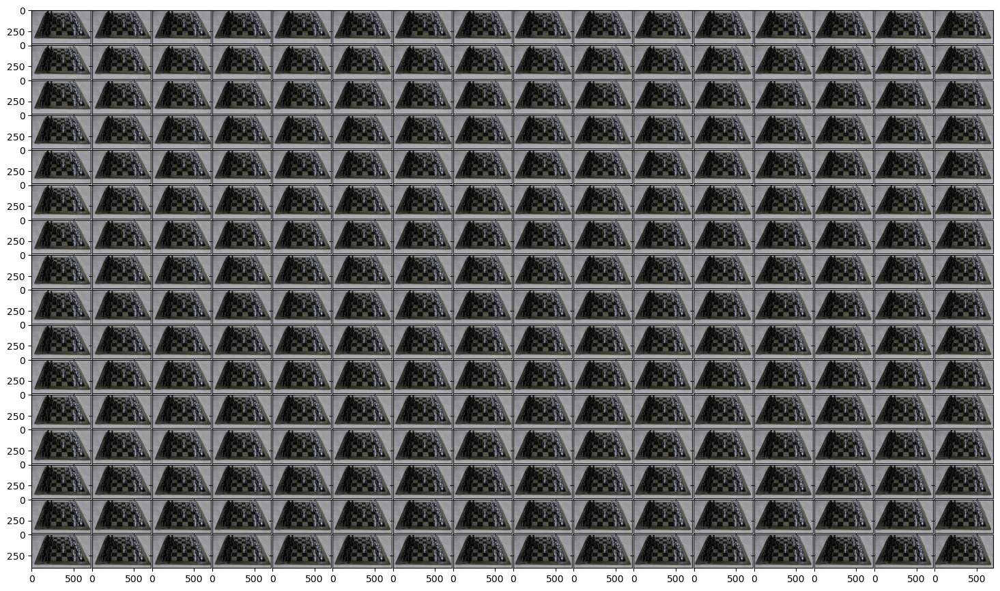

In [10]:
# Create a figure with a large size to accommodate the 16x16 grid
fig = plt.figure(figsize=(40, 40))

# Initialize the ImageGrid object for a 16x16 grid
im_grid = ImageGrid(fig, 121, (16, 16))

# Initialize a counter to keep track of the grid position
grid_count = 0

# Loop through each sub-aperture (u, v)
for u in range(16):
    for v in range(16):
        
        # Display the sub-aperture image at the current grid position
        im_grid[grid_count].imshow(L[u, v])
        
        # Increment the grid counter
        grid_count += 1

# Show the complete grid of sub-aperture images
plt.show()


## Refocusing and focal-stack simulation

In [12]:
print(L.shape)

(16, 16, 400, 700, 3)


In [13]:
# Initialize variables for refocusing
lensletSize = 16
maxUV = (lensletSize - 1) / 2
u = np.arange(lensletSize) - maxUV
v = -(np.arange(lensletSize) - maxUV)

# Compute the largest aperture image by summing all sub-aperture images
L_largest_aperture = np.sum(L, axis=(0, 1)) / (lensletSize ** 2)

# Initialize depth values and output array
# depth_list = [-2, -1, -0.75, -0.5, -0.25, -0.1, 0, 0.1, 0.25, 0.5, 0.75, 1, 1.25, 1.5, 1.75, 2]
depth_list = [-0.25, -0.1, 0, 0.1, 0.25, 0.5, 0.75, 1, 1.25, 1.5, 1.75, 1.5]

I = np.zeros([*L[0, 0].shape, len(depth_list)])

# Precompute interpolation functions for each sub-aperture and color channel
L_interp = [
    [
        interp2d(np.arange(L.shape[3]), np.arange(L.shape[2]), L[i, j, :, :, c])
        for c in range(3)
    ]
    for i in range(16) for j in range(16)
]

# Loop through each depth value to perform refocusing
for d_idx, d in enumerate(depth_list):
    print(d_idx, d)
    temp = np.zeros(L[0, 0].shape)
    
    # Loop through each sub-aperture (u, v)
    for u_idx, uc in enumerate(u):
        for v_idx, vc in enumerate(v):
            cur_fun = L_interp[u_idx * 16 + v_idx]
            
            # Shift and sum the sub-aperture images
            for c in range(3):
                temp[:, :, c] += cur_fun[c](
                    np.arange(L.shape[3]) + d * vc, np.arange(L.shape[2]) + d * uc
                )
                
    # Normalize and store the refocused image
    I[:, :, :, d_idx] = temp / (lensletSize ** 2)

# Normalize to 0-1 range
I = I / 255


0 -0.25
1 -0.1
2 0
3 0.1
4 0.25
5 0.5
6 0.75
7 1
8 1.25
9 1.5
10 1.75
11 1.5


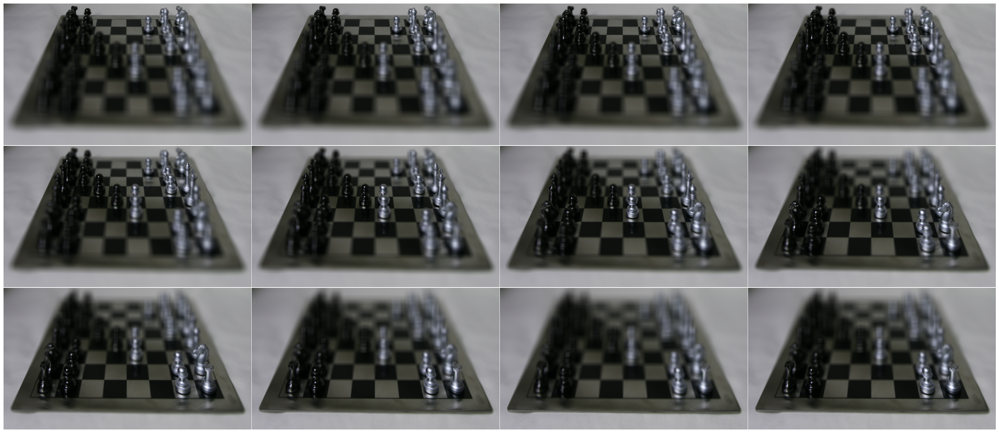

In [14]:
# Calculate the number of rows and columns for the grid
n_depths = len(depth_list)
n_cols = int(np.ceil(np.sqrt(n_depths)))
n_rows = int(np.ceil(n_depths / n_cols))

# Create a figure with a specified size
fig = plt.figure(figsize=(80, 80))

# Initialize the ImageGrid object for arranging subplots
im_grid = ImageGrid(fig, 121, nrows_ncols=(n_rows, n_cols))

# Loop through each depth to populate the grid
for d_idx in range(n_depths):
    # Display the image corresponding to the current depth
    im_grid[d_idx].imshow(I[:, :, :, d_idx])
    im_grid[d_idx].axis('off')  # Optional: Turn off axis labels and ticks

# Hide any remaining empty subplots
for d_idx in range(n_depths, n_rows * n_cols):
    im_grid[d_idx].axis('off')

# Show the complete grid of images
plt.show()


## All-in-focus image and depth from focus

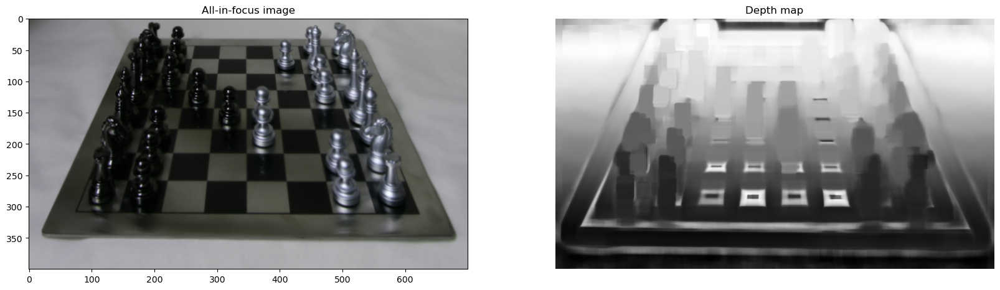

In [35]:
# Step 1: Linearize the image by removing gamma encoding
@np.vectorize
def linearize_image(C_nonlinear):
    if C_nonlinear <= 0.0404482:
        return C_nonlinear / 12.92
    else:
        return ((C_nonlinear + 0.055) / 1.055) ** 2.4

# Apply linearization and convert to XYZ color space
I_linear = linearize_image(I)
I_XYZ = np.zeros(I_linear.shape)

for foc_im in range(I_linear.shape[-1]):
    I_XYZ[:, :, :, foc_im] = lRGB2XYZ(I_linear[:, :, :, foc_im])

# Extract the Y channel for relative luminance
I_luminance = I_XYZ[:, :, 1, :]

# Apply Gaussian blur to separate low and high frequencies
kernel_size = [21, 21]
# sigma1 = 50
# sigma2 = 5

# kernel_size = [5, 5]
sigma1 = 1
sigma2 = 100

I_luminance_lowfreq = cv2.GaussianBlur(I_luminance, kernel_size, sigma1)
I_luminance_highfreq = I_luminance - I_luminance_lowfreq

# Compute sharpness weight
w_sharpness = cv2.GaussianBlur(I_luminance_highfreq ** 2, kernel_size, sigma2)

# Compute the all-in-focus image
I_AllInFocus = np.zeros(I.shape[:-1])

for c in range(3):  # Loop through RGB channels
    I_AllInFocus[:, :, c] = np.sum(w_sharpness * I[:, :, c, :], axis=-1) / np.sum(w_sharpness, axis=-1)


# Compute the depth map
num = np.zeros(I_AllInFocus.shape[:2])
den = np.zeros(I_AllInFocus.shape[:2])

for foc_im in range(I_linear.shape[-1]):
    num += w_sharpness[:, :, foc_im] * depth_list[foc_im]
    den += w_sharpness[:, :, foc_im]

img_depth = num / den

# # Display the depth map
# plt.imshow(1 - img_depth, cmap='gray')
# plt.show()

# range of depth values to be 0 to 1
img_depth_norm = (img_depth - np.min(img_depth)) / (np.max(img_depth) - np.min(img_depth))

plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
# Display the all-in-focus image
plt.imshow(I_AllInFocus)
plt.title('All-in-focus image')

plt.subplot(1, 2, 2)
plt.imshow(1-img_depth_norm, cmap='gray')
plt.axis('off')
plt.title('Depth map')
plt.show()  



In [74]:
plt.imsave('results/P1_all_in_focus.png', I_AllInFocus)
plt.imsave('results/P1_depth_map.png', 1-img_depth_norm, cmap='gray')

## Focal-aperture stack and confocal stereo

In [54]:
# Initialize variables for Focal Aperture Stack and Confocal Stereo
aperture_size_list = [2, 4, 6, 8, 10, 12, 14, 16]
I_FocalApertureStack = np.zeros([*L[0, 0].shape, len(depth_list), len(aperture_size_list)])

# Loop through each aperture size
for a_idx, aperture_size in enumerate(aperture_size_list):
    print(f"Processing aperture size {a_idx}")
    
    # Loop through each depth value
    for d_idx, d in enumerate(depth_list):
        temp = np.zeros(L[0, 0].shape)
        
        # Loop through each sub-aperture (u, v)
        for u_idx, uc in enumerate(u):
            # Skip sub-apertures outside the current aperture size
            if np.abs(uc) > aperture_size / 2:
                continue
            
            for v_idx, vc in enumerate(v):
                # Skip sub-apertures outside the current aperture size
                if np.abs(vc) > aperture_size / 2:
                    continue
                
                # Get the interpolation function for the current sub-aperture
                cur_fun = L_interp[u_idx * 16 + v_idx]
                
                # Shift and sum the sub-aperture images for each color channel
                for c in range(3):
                    temp[:, :, c] += cur_fun[c](
                        np.arange(L.shape[3]) + d * vc, np.arange(L.shape[2]) + d * uc
                    )
        
        # Normalize and store the image for the current depth and aperture size
        I_FocalApertureStack[:, :, :, d_idx, a_idx] = temp / (aperture_size ** 2)

# Normalize to 0-1 range
I_FocalApertureStack = I_FocalApertureStack / 255


Processing aperture size 0
Processing aperture size 1
Processing aperture size 2
Processing aperture size 3
Processing aperture size 4
Processing aperture size 5
Processing aperture size 6
Processing aperture size 7


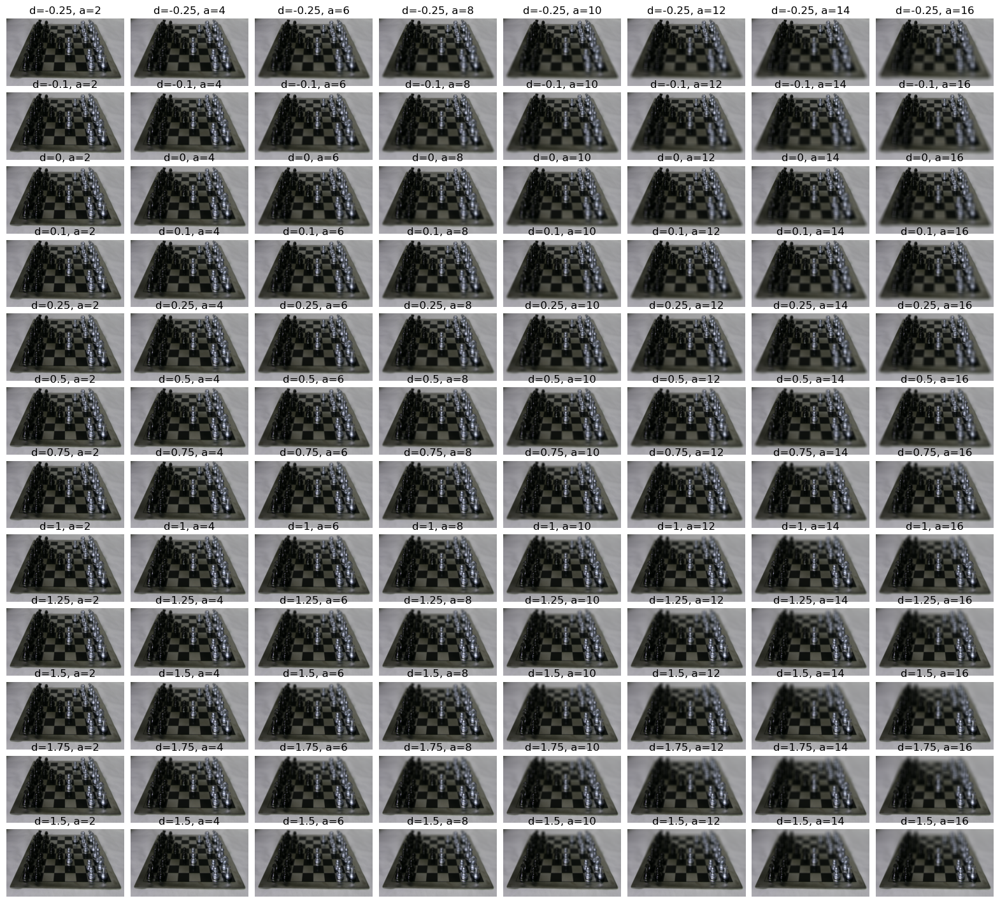

In [55]:
# Create a figure with a specified size
fig = plt.figure(figsize=(20, 20))

# Initialize the ImageGrid object for arranging subplots
grid = ImageGrid(fig, 111, nrows_ncols=(len(depth_list), len(aperture_size_list)), axes_pad=0.1)

# Loop through each depth and aperture size to populate the grid
for d_idx in range(len(depth_list)):
    for a_idx in range(len(aperture_size_list)):
        
        # Calculate the index for the current subplot
        ax_idx = d_idx * len(aperture_size_list) + a_idx
        
        # Get the corresponding axis object
        ax = grid[ax_idx]
        
        # Display the image corresponding to the current depth and aperture size
        ax.imshow(I_FocalApertureStack[:, :, :, d_idx, a_idx])
        
        # Set the title indicating the depth and aperture size
        ax.set_title(f"d={depth_list[d_idx]}, a={aperture_size_list[a_idx]}")
        
        # Turn off axis labels and ticks
        ax.axis('off')

# Show the complete grid of images
plt.show()


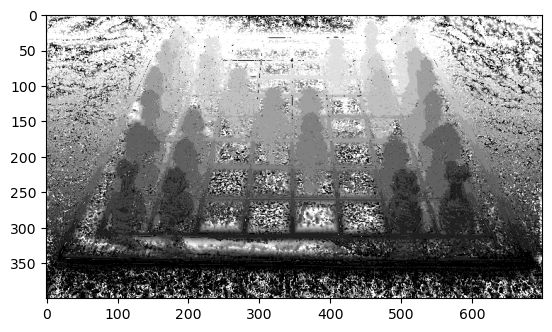

In [56]:
# Initialize an array to store the depth for each pixel
img_depth_FAS = np.zeros([I_FocalApertureStack.shape[0], I_FocalApertureStack.shape[1]])

# Loop through each pixel in the image
for i in range(I_FocalApertureStack.shape[0]):
    for j in range(I_FocalApertureStack.shape[1]):
        
        # Calculate the variance across different focus levels for the current pixel
        variances = np.var(I_FocalApertureStack[i, j, :], axis=-1)
        
        # Sum the variances across different aperture sizes
        summed_variances = np.sum(variances, axis=0)
        
        # Find the index of the focus level that minimizes the summed variance
        f_star_index = np.argmin(summed_variances)
        
        # Assign the corresponding depth value to the pixel
        img_depth_FAS[i, j] = depth_list[f_star_index]

# Display the depth map
plt.imshow(1 - img_depth_FAS, cmap='gray')
plt.show()


In [75]:
plt.imsave('results/P1_depth_map_FAS.png', 1-img_depth_FAS, cmap='gray')

In [58]:
len(depth_list)

12

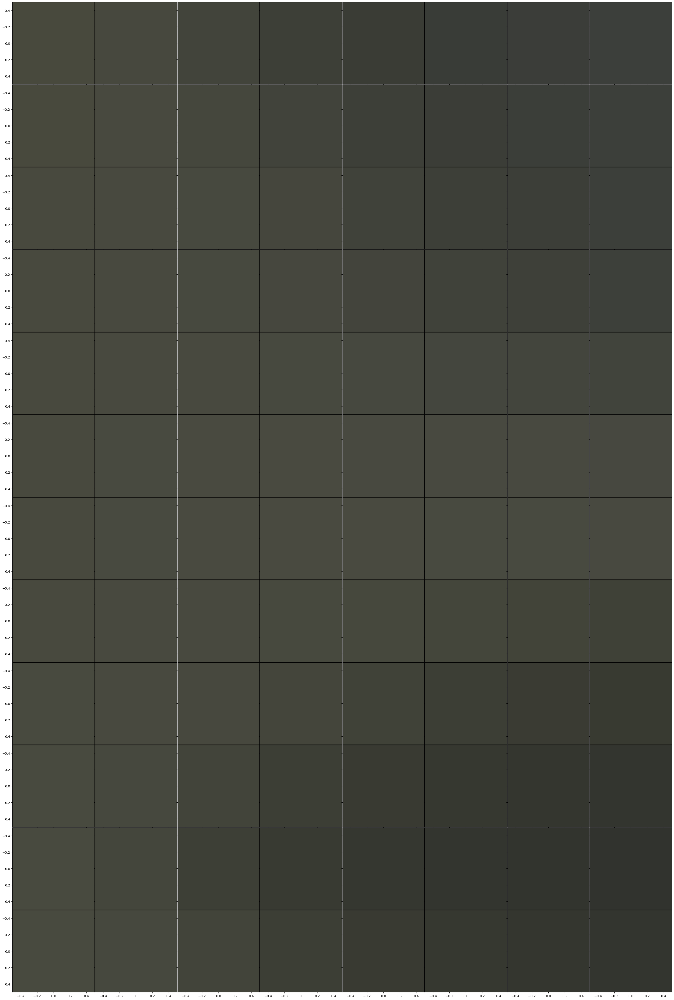

In [71]:

# Create a figure with a specified size
fig = plt.figure(figsize=(80, 80))

# Initialize the ImageGrid object for arranging subplots
im_grid = ImageGrid(fig, 121, nrows_ncols=(len(depth_list), len(aperture_size_list)))

# Initialize a counter for grid placement
grid_count = 0

# Loop through each depth and aperture size to populate the grid
for d_idx in range(len(depth_list)):
    for ai in range(len(aperture_size_list)):
        
        # Extract the specific region of the image for the current depth and aperture size
        image_region = I_FocalApertureStack[180:181, 480:481, :, d_idx, ai]
        
        # Display the image region in the current grid cell
        im_grid[grid_count].imshow(image_region)
        
        # Increment the grid counter
        grid_count += 1

# Show the complete grid of images
plt.show()
